# Info

This kernel uses regular U-Net with slightly deeper layers composing with SEBlocks as training model. <br />
Also I use swish to replace relu to be my activation function. <br />
And I changed the loss function from weighted bce + DiceLoss to ComboLoss( weighted bce + FocalLoss + Tversky_Loss) with certain weights <br />
With these three changes in my model training, the LB score can increase about 0.02( 0.86 -> 0.88 ) <br />


And as I mentioned in my last share kernel, I also did some pre/post-processing on the data and prediction to improve the score. <br />
The total training time would be a little bit long (about 7-8 hours to convergence）since I didnt use pretrain weights. <br />
The training processes are at version 8, 9 and 10 in this kernel. <br />
I think the depth can be increased further after adding shortcut in the model, which might help the convergence either. <br />

**model**<br />
1.UNet + Squeeze and Excitation network <br />
2.Swish activation <br />
<br />

**loss function**<br />
CombeLoss (weighted bce + FocalLoss + Tversky_Loss) with 0.4 : 0.2 : 0.4 weighting <br />
<br />

**preprocessing** <br />
1. gamma correction
2. contrast enhnacement
<br />

**postprocessing** <br />
1. mask reduction (Which is the same as Rishabh Agrahari's share)
<br />
<br />

**Future work** <br />
1. Try more complex model or add short cut for making deeper network.
2. Use pre-train model for decoding part.
3. Deal with imbalance class.

Again, I am quite new to this field, if I had done something wrong, please let me know. <br />

Squeeze and Excitiation Networks: https://arxiv.org/abs/1709.01507 <br />


In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/model-unet/unet_out.hdf5
/kaggle/input/severstal-steel-defect-detection/sample_submission.csv
/kaggle/input/severstal-steel-defect-detection/train.csv
/kaggle/input/severstal-steel-defect-detection/train_images/e89d1f0d8.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/5092b3368.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/ac9c592aa.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/b537ab3ce.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/fb6666769.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/1dc0e1d12.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/a3fc0bdd6.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/799a31455.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/b504ef19c.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/69fa024d2.jpg
/kaggle/input/severstal-steel-defect-detection/train_images/5574a47da.jpg
/kaggle/input/severst

In [2]:
import numpy as np 
import pandas as pd 
import os

import keras
import keras.backend as K
import keras.layers as klayers
from keras.preprocessing.image import load_img
import albumentations as albu
from albumentations import (HorizontalFlip, VerticalFlip, ShiftScaleRotate, CLAHE , GridDistortion)
from sklearn.model_selection import train_test_split

import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
import gc
import random
main_dir = '../input/severstal-steel-defect-detection/'
os.listdir(main_dir)

Using TensorFlow backend.


['sample_submission.csv', 'train.csv', 'train_images', 'test_images']

# Hyper-parameters

In [3]:
pretrain_weights_path = '/kaggle/input/model-unet/unet_out.hdf5'
batch_size = 32
epochs = 15
reshape_rgb = (256, 512, 3)
reshape_mask = (256, 512)
mask_threshold = 3500
mask_bound = 0.8
lr = 1e-4

# Data preparation/EDA/Visualization

In [4]:
train_fns = os.listdir(main_dir + 'train_images')
test_fns = os.listdir(main_dir + 'test_images')
train_seg = pd.read_csv(main_dir + 'train.csv')

print(len(train_fns))
print(len(test_fns))
print(train_seg.shape)

train_seg.head(5)

12568
1801
(50272, 2)


,ImageId_ClassId,EncodedPixels
0,0002cc93b.jpg_1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0002cc93b.jpg_2,NaN
2,0002cc93b.jpg_3,NaN
3,0002cc93b.jpg_4,NaN
4,00031f466.jpg_1,NaN


In [5]:
train_seg['ImageId'] = train_seg['ImageId_ClassId'].map(lambda x : x.split('_')[0])
train_seg['ClassId'] = train_seg['ImageId_ClassId'].map(lambda x : x.split('_')[1])
train_seg = train_seg.drop(['ImageId_ClassId'], axis = 1)

In [6]:
train_seg['has_label'] = train_seg['EncodedPixels'].map(lambda x : 1 if isinstance(x,str) else 0)
train_seg.head(5)

,EncodedPixels,ImageId,ClassId,has_label
0,29102 12 29346 24 29602 24 29858 24 30114 24 3...,0002cc93b.jpg,1,1
1,NaN,0002cc93b.jpg,2,0
2,NaN,0002cc93b.jpg,3,0
3,NaN,0002cc93b.jpg,4,0
4,NaN,00031f466.jpg,1,0


## Some utilities function

In [7]:
def rle_encoding(mask):
    
    pixels = mask.T.flatten()
    pixels = np.concatenate([[0], pixels,[0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    if len(runs) % 2:
        runs = np.append(runs,len(pixels))
    runs[1::2] -= runs[0::2]
    
    return ' '.join(str(x) for x in runs)

def rle_decoding(rle, mask_shape = (256,1600)):
    strs = rle.split(' ')
    starts = np.asarray(strs[0::2], dtype = int) - 1
    lengths = np.asarray(strs[1::2], dtype = int)
    ends = starts + lengths
    
    mask = np.zeros(mask_shape[0] * mask_shape[1], dtype = np.uint8)
    for s,e in zip(starts, ends):
        mask[s:e] = 1
    return mask.reshape(mask_shape, order = 'F')

def merge_masks(image_id, df, mask_shape = (256,1600), reshape = None):
    
    rles = df[df['ImageId'] == image_id].EncodedPixels.iloc[:]
    depth = rles.shape[0]
    if reshape:
        masks = np.zeros((*reshape, depth), dtype = np.uint8)
    else:
        masks = np.zeros((mask_shape[0], mask_shape[1],depth), dtype = np.uint8)
    
    for idx in range(depth):
        if isinstance(rles.iloc[idx], str):
            if reshape:
                cur_mask = rle_decoding(rles.iloc[idx], mask_shape)
                cur_mask = cv2.resize(cur_mask, (reshape[1], reshape[0]))
                masks[:,:,idx] += cur_mask
            else:         
                masks[:,:,idx] += rle_decoding(rles.iloc[idx], mask_shape)
    return masks   

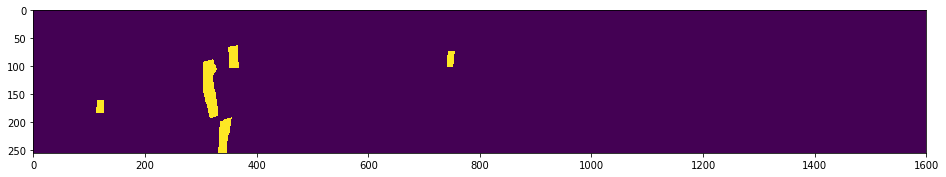

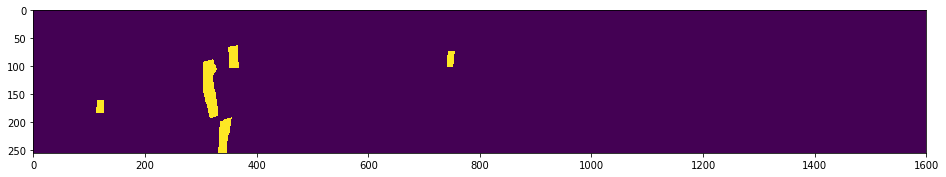

In [8]:
#Check rle_encoding and rle_decoding

rle_1 = train_seg['EncodedPixels'].iloc[0]
mask_1 = rle_decoding(rle_1)
rle_2 = rle_encoding(mask_1)
mask_2 = rle_decoding(rle_2)

plt.figure(figsize = (16,8))
plt.imshow(mask_1)
plt.show()
plt.figure(figsize = (16,8))
plt.imshow(mask_2)
plt.show()

In [9]:
def display_img_masks(img, masks, image_id = "", title = ""):
    for idx in range(masks.shape[-1]):
        plt.figure(figsize = (24,6))
        plt.imshow(img)
        plt.imshow(masks[:,:,idx], alpha = 0.35, cmap = 'gray')
        plt.title(image_id + '_class_' + str(idx+1) + title)
        plt.show()

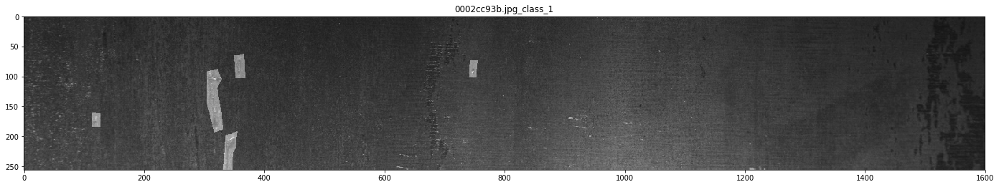

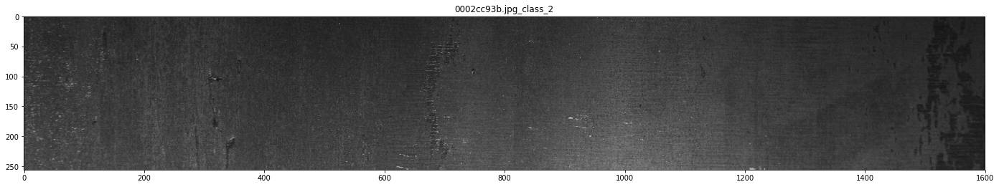

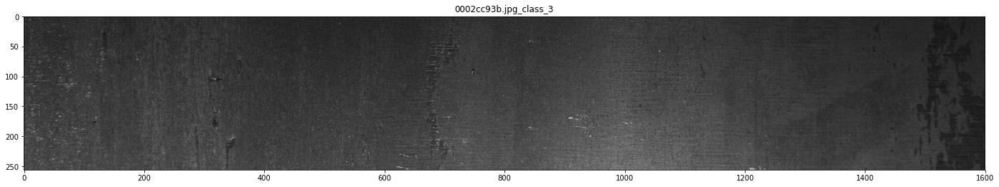

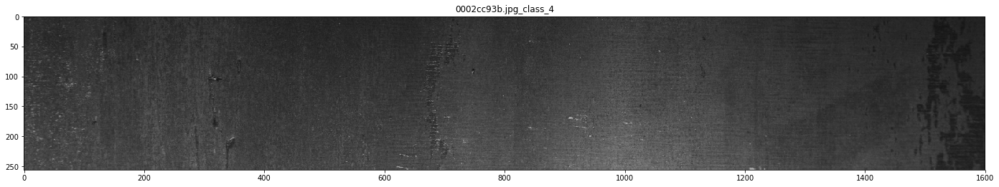

In [10]:
image_dir = main_dir + 'train_images/' + train_seg['ImageId'].iloc[0]
image_id = train_seg['ImageId'].iloc[0]
img = plt.imread(image_dir)
masks = merge_masks(image_id, train_seg)

display_img_masks(img,masks, image_id)

# Data Generator

Here I using two data pre-processing techiques and trying to improve the result.

**A. gamma correction** <br />
Gamma correction is a very common operation in traditional image processing. Since human visual system is non-linear response to visible light, so the ISP on phone or digital camera will perform gamma correction to produce better contrast for human visual system. Anyway, it is a image enhancement techique. <br />

**B. Contrast Limited Adaptive Histogram Equalization(CLAHE)** <br />
This is also a contrast enhancement techique, it is very similar to regular histogram equalization. But it is doing the effect on small blocks, which can avoid over-brightness in regular histogram equalization.

reference: https://docs.opencv.org/3.3.1/d5/daf/tutorial_py_histogram_equalization.html

In [11]:
gamma = 1.2
inverse_gamma = 1.0 / gamma
look_up_table = np.array([((i/255.0) ** inverse_gamma) * 255.0 for i in np.arange(0,256,1)]).astype("uint8")
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

def contrast_enhancement(img):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img[:,:,0] = clahe.apply(img[:,:,0])
    img = cv2.cvtColor(img, cv2.COLOR_YUV2RGB)
    return img

def gamma_correction(img):
    return cv2.LUT(img.astype('uint8'), look_up_table)

def load_target_image(path, grayscale = False, color_mode = 'rgb', target_size = reshape_rgb,
                     interpolation = 'nearest'):
    
    return load_img(path = path, grayscale = grayscale, color_mode = color_mode,
                   target_size = target_size, interpolation = interpolation)

def input_gen(filenames, segs, aug, batch_size = 4, reshape = (256,1600)):
    
    load_dir = main_dir + 'train_images/'
    
    batch_rgb = []
    batch_mask = []
    
    while True:
        fns = random.sample(filenames, batch_size)
        seed = np.random.choice(range(999))
        for fn in fns:
            cur_img = np.asarray(load_target_image(path = load_dir + fn))
            cur_img = gamma_correction(cur_img)
            cur_img = contrast_enhancement(cur_img)
            masks = merge_masks(fn, segs, reshape = reshape)            
            processed = aug(image = cur_img, mask = masks)

            batch_rgb.append(processed['image']/255.0)
            batch_mask.append(processed['mask'])
        
        batch_rgb, batch_mask = np.stack(batch_rgb), np.stack(batch_mask)
        
        yield batch_rgb, batch_mask
        batch_rgb = []
        batch_mask = []
        gc.collect()

In [12]:
train_x, valid_x = train_test_split(train_fns, test_size = 0.2, random_state = 2019)
print(len(train_x))
print(len(valid_x))

10054
2514


In [13]:
aug_for_train = albu.Compose([HorizontalFlip(p=0.5),
                             ShiftScaleRotate(scale_limit=0.2, shift_limit=0.1, rotate_limit=15, p=0.5),
                             GridDistortion(p=0.5)])
aug_for_valid = albu.Compose([])


train_aug_gen = input_gen(train_x, train_seg, aug_for_train, batch_size = batch_size,reshape = reshape_mask)
valid_aug_gen = input_gen(valid_x, train_seg, aug_for_valid, batch_size = batch_size,reshape = reshape_mask)

# Build the SEUNet

Squeeze-and-Excitiation Networks can be divide in two parts, squeeze and excitation parts. <br />
In very simple explanation, it aggregates feature maps across their spatial dimension and makes them as channel descriptor. <br />
And it can learn the importance of dependencies of each channels during training. <br />
Then multiply the weights to its corresponding channels of input tensor to enhance/decrease the importance. <br />

In [14]:
class Unet:
    
    def __init__(self, input_shape = (256,1600,3), output_units = 4):
        
        self.input_shape = input_shape
        self.output_units = output_units
        
    def _swish(self,x):
        return K.sigmoid(x)*x
    
    def _SEBlock(self, se_ratio=16, activation = "relu"):
        
        def f(input_x):

            input_channels = input_x._keras_shape[-1]
            reduced_channels = max(input_channels // se_ratio, 8)
            
            x = klayers.GlobalAveragePooling2D()(input_x)
            x = klayers.Dense(units = reduced_channels, kernel_initializer = "he_normal")(x)
            x = klayers.Activation(activation)(x)
            x = klayers.Dense(units = input_channels, activation = 'sigmoid', kernel_initializer = "he_normal")(x)
            
            return klayers.multiply([input_x, x])
        
        return f    
    
    def _cn_bn_act(self, filters = 64, kernel_size = (3,3), bn_flag = False, activation = "relu"):
        
        def f(input_x):
            
            x = input_x
            x = klayers.Conv2D(filters = filters, kernel_size = kernel_size, strides = (1,1), padding = "same", kernel_initializer = "he_normal")(x)
            x = klayers.BatchNormalization()(x) if bn_flag == True else x
            x = klayers.Activation(activation)(x)
            
            return x
        
        return f
    
    def _UpSamplingBlock(self, filters = 64, kernel_size = (3,3), upsize = (2,2), bn_flag = True, up_flag = False, se_flag = True):
        
        def f(up_c, con_c):
            
            if up_flag:
                x = klayers.UpSampling2D(size = upsize, interpolation = 'bilinear')(up_c)
            else:
                x = klayers.Conv2DTranspose(filters = filters, kernel_size = (2,2), strides = upsize, padding = "same", kernel_initializer = "he_normal")(up_c)
            
            x = klayers.concatenate([x,con_c])
            x = self._cn_bn_act(filters = filters, kernel_size = kernel_size, bn_flag = bn_flag, activation = self._swish)(x)
            x = self._SEBlock(activation = self._swish)(x) if se_flag == True else x
            x = self._cn_bn_act(filters = filters, kernel_size = kernel_size, bn_flag = bn_flag, activation = self._swish)(x)
            
            return x
        return f
    
    def _DownSamplingBlock(self, filters = 64, kernel_size = (3,3), downsize = (2,2), bn_flag = True, is_bottom = False, se_flag = True):
        
        def f(input_x):
            
            x = self._cn_bn_act(filters = filters, kernel_size = kernel_size, bn_flag = bn_flag, activation = self._swish)(input_x)
            x = self._SEBlock(activation = self._swish)(x) if se_flag == True else x
            c = self._cn_bn_act(filters = filters, kernel_size = kernel_size, bn_flag = bn_flag, activation = self._swish)(x)
            return c if (is_bottom == True) else (c,klayers.MaxPooling2D(pool_size = downsize)(c))
            
        return f
    
    def build_unet(self):
        
        
        input_x = klayers.Input(shape = self.input_shape)
        #encoder region
        c1,p1 = self._DownSamplingBlock(filters = 16)(input_x)
        c2,p2 = self._DownSamplingBlock(filters = 32)(p1)
        c3,p3 = self._DownSamplingBlock(filters = 32)(p2)
        c4,p4 = self._DownSamplingBlock(filters = 64)(p3)
        c5,p5 = self._DownSamplingBlock(filters = 128)(p4)
        
        c6 = self._DownSamplingBlock(filters = 256, is_bottom = True)(p5)
        
        #decoder region
        u7 = self._UpSamplingBlock(filters = 128)(c6,c5)
        u8 = self._UpSamplingBlock(filters = 64)(u7,c4)
        u9 = self._UpSamplingBlock(filters = 32)(u8,c3)
        u10 = self._UpSamplingBlock(filters = 32)(u9,c2)
        u11 = self._UpSamplingBlock(filters = 16)(u10,c1)
        output_x = klayers.Conv2D(filters = self.output_units, kernel_size = (1,1), padding = "same", activation = "sigmoid", kernel_initializer = "he_normal")(u11)
        model = keras.models.Model(inputs = [input_x], outputs = [output_x])
        return model
        

In [15]:
unet_builder = Unet(input_shape = reshape_rgb)
unet = unet_builder.build_unet()
unet.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 512, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 512, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 256, 512, 16) 64          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 256, 512, 16) 0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

In [16]:
if pretrain_weights_path != None:
    unet.load_weights(pretrain_weights_path)

# Loss fucntion
<br />
The main idea of using Combo loss is very simple: <br /><br />
Tversky Loss and weighted bce -> reduce the false positive<br />
Focal Loss -> Learn hard samples in training set.<br />

In [17]:
def Tversky_Loss(y_true, y_pred, smooth = 1, alpha = 0.3, beta = 0.7, flatten = False):
    
    if flatten:
        y_true = K.flatten(y_true)
        y_pred = K.flatten(y_pred)
    
    TP = K.sum(y_true * y_pred)
    FP = K.sum((1-y_true) * y_pred)
    FN = K.sum(y_true * (1-y_pred))
    
    tversky_coef = (TP + smooth) / (TP + alpha * FP + beta * FN + smooth)
    
    return 1 - tversky_coef

def Focal_Loss(y_true, y_pred, alpha = 0.8, gamma = 2.0, flatten = False):
    
    if flatten:
        y_true = K.flatten(y_true)
        y_pred = K.flatten(y_pred)    
    
    bce = keras.losses.binary_crossentropy(y_true, y_pred)
    bce_exp = K.exp(-bce)
    
    loss = K.mean(alpha * K.pow((1-bce_exp), gamma) * bce)
    return loss

def weighted_bce(weight = 0.6):
    
    def convert_2_logits(y_pred):
        y_pred = tf.clip_by_value(y_pred, K.epsilon(), 1 - K.epsilon())
        return tf.log(y_pred / (1-y_pred))
    
    def weighted_binary_crossentropy(y_true, y_pred):
        y_pred = convert_2_logits(y_pred)
        loss = tf.nn.weighted_cross_entropy_with_logits(logits = y_pred, targets = y_true, pos_weight = weight)
        return loss
    
    return weighted_binary_crossentropy

def Combo_Loss(y_true, y_pred, a = 0.4, b = 0.2, c= 0.4):
    
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    
    return a*weighted_bce()(y_true, y_pred) + b*Focal_Loss(y_true_f, y_pred_f) + c*Tversky_Loss(y_true_f, y_pred_f)

def Dice_coef(y_true, y_pred, smooth = 1):

    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
 
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def Dice_loss(y_true, y_pred):   
    return  1.0 - Dice_coef(y_true, y_pred) 

In [18]:
optimizer = keras.optimizers.Adam(lr = lr, decay = 1e-6)
unet.compile(loss = Combo_Loss, optimizer = optimizer, metrics = [Dice_coef])

reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor = 'val_loss', patience = 2, mode = 'min', factor = 0.5, verbose = 1)
cp = keras.callbacks.ModelCheckpoint('unet_out.hdf5', monitor = 'val_loss', verbose = 1, save_best_only = True, mode = 'min')
es = keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 10, mode = 'min')
training_callbacks = [reduce_lr, cp, es]

steps_per_epoch = len(train_x) // batch_size
validation_steps = len(valid_x) // batch_size

In [19]:
'''
history = unet.fit_generator(train_aug_gen, steps_per_epoch = steps_per_epoch, epochs = epochs,
                              validation_data = valid_aug_gen, validation_steps = validation_steps, verbose = 1, callbacks = training_callbacks)


unet.load_weights('unet_out.hdf5')
'''

"\nhistory = unet.fit_generator(train_aug_gen, steps_per_epoch = steps_per_epoch, epochs = epochs,\n                              validation_data = valid_aug_gen, validation_steps = validation_steps, verbose = 1, callbacks = training_callbacks)\n\n\nunet.load_weights('unet_out.hdf5')\n"

# Validation

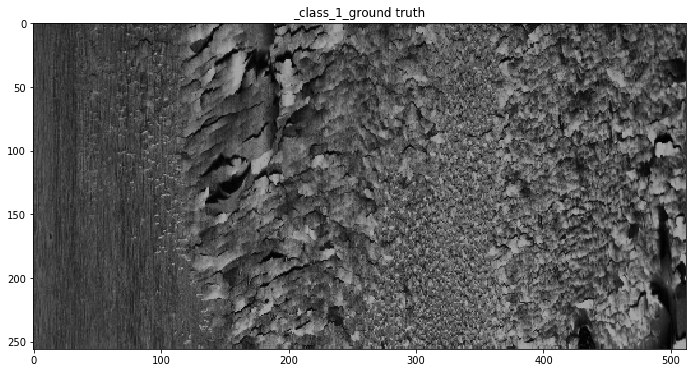

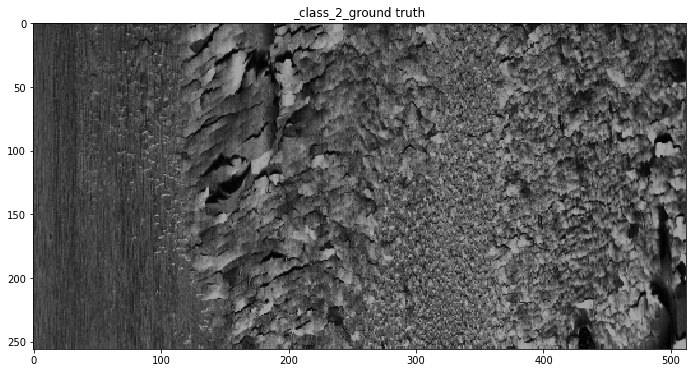

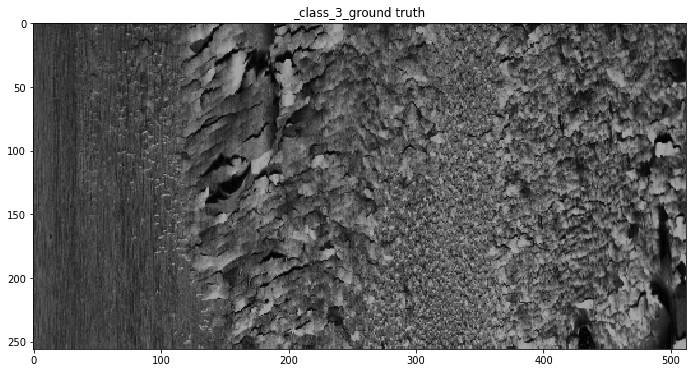

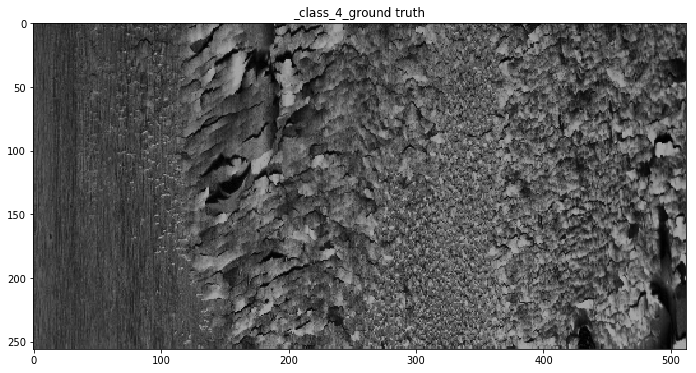

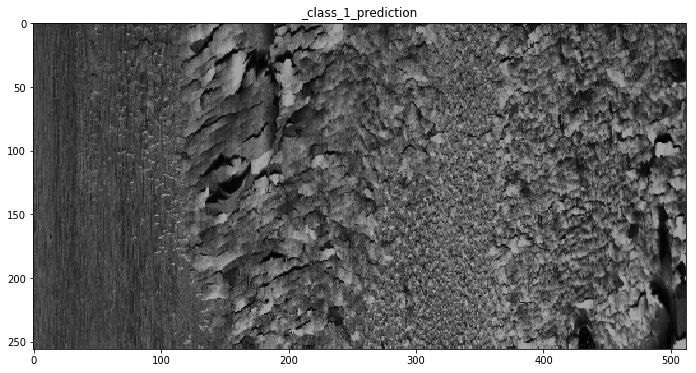

...

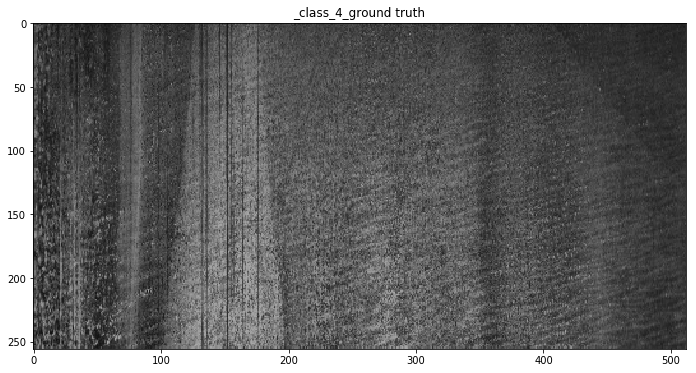

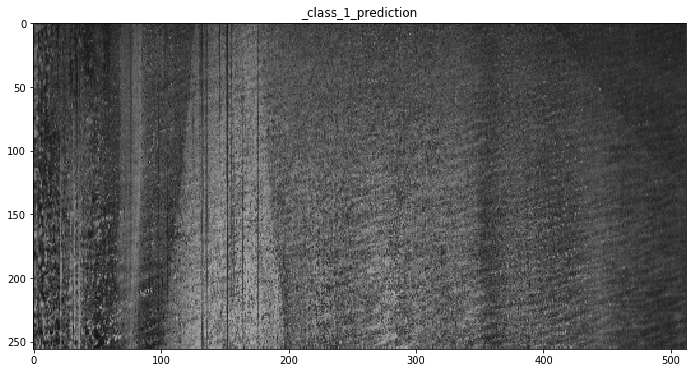

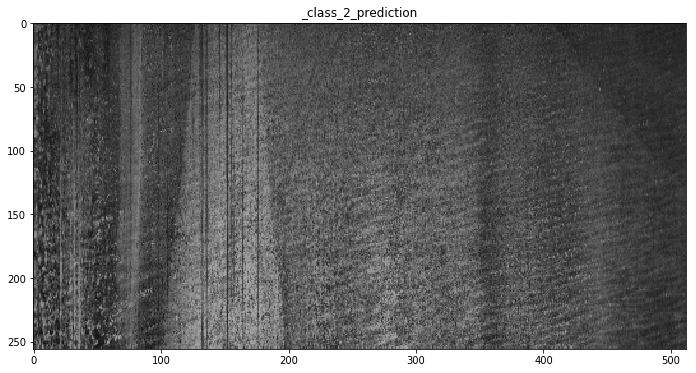

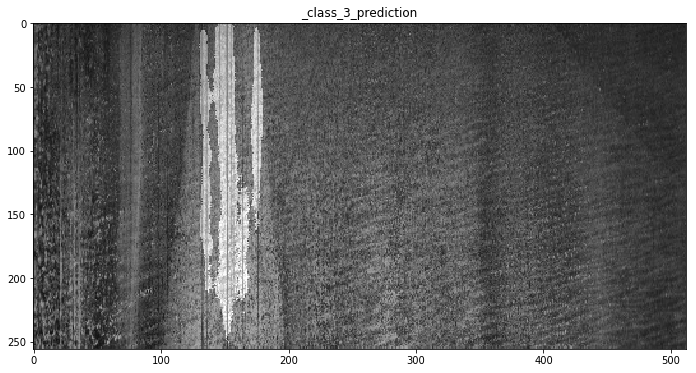

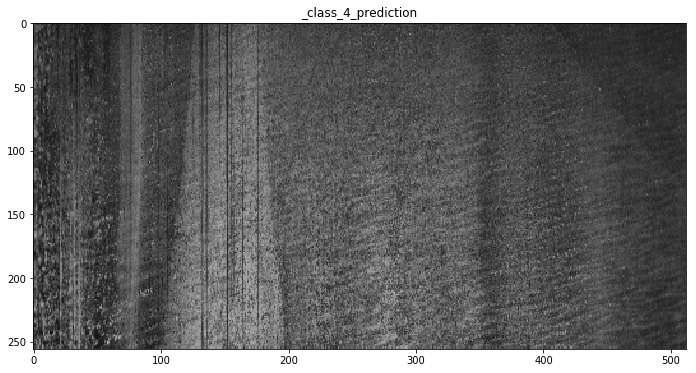

In [20]:

def predict_masks(img):
    
    masks = unet.predict(np.expand_dims(img, axis = 0))
    masks = masks > mask_bound
    masks = np.squeeze(masks, axis = 0)
    
    return masks

valid_aug_gen = input_gen(valid_x, train_seg, aug_for_valid, batch_size = 8, reshape = reshape_mask)

valid_data, valid_label = next(valid_aug_gen)
for x,y in zip(valid_data, valid_label):
    display_img_masks(x,y,title = "_ground truth")
    prediction = predict_masks(x)
    display_img_masks(x,prediction, title = '_prediction')


In [21]:

valid_count = 1600
valid_predictions = np.zeros((valid_count,256,1600))
valid_truths = []
valid_aug_gen = input_gen(valid_x, train_seg, aug_for_valid, batch_size = 1, reshape = reshape_mask)

for idx in tqdm_notebook(range(int(valid_count/4))):
    img, true_masks = next(valid_aug_gen)  
    true_masks = true_masks[0]
    pred_masks = np.squeeze( unet.predict(img), axis = 0)
    pred_masks = cv2.resize(pred_masks, (1600, 256), interpolation = cv2.INTER_LINEAR)
    
    for i in range(pred_masks.shape[-1]):
        valid_predictions[idx*4+i, :, :] = pred_masks[:,:,i]
    
    for tm_id in range(true_masks.shape[-1]):
        valid_truths.append(cv2.resize(true_masks[:,:,tm_id], dsize = (1600,256), interpolation = cv2.INTER_LINEAR))
    
    gc.collect()

In [22]:

def Dice(y_true, y_pred, smooth = 1):

    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
 
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

def single_mask_reduce(mask, minSize):
    label_num, label_mask = cv2.connectedComponents(mask.astype(np.uint8))
    reduced_mask = np.zeros(mask.shape, np.float32)
    for label in range(1, label_num):
        single_label_mask = (label_mask == label)
        if single_label_mask.sum() > minSize:
            reduced_mask[single_label_mask] = 1
            
    return reduced_mask

class_params = {}

for class_id in range(4):
    print(class_id)
    attemps = []
    for th in range(0,100,5):
        th = th / 100
        d = 0
        for ms in [3500]:
            for i in range(class_id, len(valid_predictions), 4):
                valid_pred = valid_predictions[i]
                valid_pred = np.array(valid_pred > th, np.uint8)
                valid_pred = single_mask_reduce(valid_pred, ms)
                if valid_pred.sum() == 0 and np.sum(valid_truths[i]) == 0:
                    d += 1
                else:
                    d += Dice(valid_pred, valid_truths[i])
            attemps.append((th, ms, d/(len(valid_predictions)//4) ))
            
    attempts_df = pd.DataFrame(attemps, columns = ['threshold', 'size', 'dice'])
    attempts_df = attempts_df.sort_values('dice', ascending = False)
    print(attempts_df.head())
    best_threshold = attempts_df['threshold'].values[0]
    best_size = attempts_df['size'].values[0]
    
    class_params[class_id] = (best_threshold, best_size)


0
    threshold  size      dice
10       0.50  3500  0.935025
11       0.55  3500  0.935025
18       0.90  3500  0.935025
17       0.85  3500  0.935025
16       0.80  3500  0.935025
1
    threshold  size      dice
10       0.50  3500  0.967512
11       0.55  3500  0.967512
18       0.90  3500  0.967512
17       0.85  3500  0.967512
16       0.80  3500  0.967512
2
    threshold  size      dice
18       0.90  3500  0.733654
17       0.85  3500  0.733588
16       0.80  3500  0.730951
15       0.75  3500  0.730237
14       0.70  3500  0.722854
3
    threshold  size      dice
10       0.50  3500  0.945003
11       0.55  3500  0.945003
18       0.90  3500  0.945003
17       0.85  3500  0.945003
16       0.80  3500  0.945003


In [23]:

sub = pd.DataFrame(columns = ['ImageId_ClassId', 'EncodedPixels'])

def mask_reduce(masks, class_params):
    
    for idx in range(masks.shape[-1]):
        masks[:,:,idx] = np.array(masks[:,:,idx] > class_params[idx][0])
        
        label_num, labeled_mask = cv2.connectedComponents(masks[:,:,idx].astype(np.uint8))
        reduced_mask = np.zeros(masks.shape[:2],np.float32)
        
        for label in range(1, label_num):
            single_label_mask = (labeled_mask == label)
            if single_label_mask.sum() >  class_params[idx][1]:
                reduced_mask[single_label_mask] = 1
        
        masks[:,:,idx] = reduced_mask
        
    return masks


def prediction_encoding(fn, img_dir, submission, target_shape = (256,1600)):
    img = np.asarray(load_target_image(path = os.path.join(img_dir,fn)))
    img = gamma_correction(img)
    img = contrast_enhancement(img)/255.0
    masks = unet.predict(np.expand_dims(img, axis = 0))
    masks = np.squeeze( np.round(masks), axis = 0)
    masks = cv2.resize(masks, (target_shape[1], target_shape[0]))
    masks = mask_reduce(masks, class_params)
    
    ImageId_ClassId = np.asarray([ fn+'_'+str(id) for id in range(1,5) ])
    for idx in range(masks.shape[-1]):
        submission = submission.append(pd.DataFrame([[ImageId_ClassId[idx], rle_encoding(masks[:,:,idx])]], columns = ["ImageId_ClassId", "EncodedPixels"]))
        
    return submission

load_dir = main_dir + 'test_images/'

for fn in tqdm_notebook(test_fns):
    sub = prediction_encoding(fn, load_dir, sub)
    gc.collect()
    
sub.head(10)


,ImageId_ClassId,EncodedPixels
0,cdfb634a5.jpg_1,
0,cdfb634a5.jpg_2,
0,cdfb634a5.jpg_3,287739 2 287995 2 288251 2 288506 4 288762 4 2...
0,cdfb634a5.jpg_4,
0,9184715d9.jpg_1,
0,9184715d9.jpg_2,
0,9184715d9.jpg_3,
0,9184715d9.jpg_4,
0,8e0f84b88.jpg_1,
0,8e0f84b88.jpg_2,


In [24]:

sub_sample = pd.read_csv(main_dir + 'sample_submission.csv')
sub_sample = sub_sample.drop(['EncodedPixels'], axis = 1)

submission = sub_sample.merge(sub, on = ['ImageId_ClassId'])
submission.to_csv('submission.csv', index = False)
submission.head(10)


,ImageId_ClassId,EncodedPixels
0,004f40c73.jpg_1,
1,004f40c73.jpg_2,
2,004f40c73.jpg_3,
3,004f40c73.jpg_4,
4,006f39c41.jpg_1,
5,006f39c41.jpg_2,
6,006f39c41.jpg_3,
7,006f39c41.jpg_4,
8,00b7fb703.jpg_1,
9,00b7fb703.jpg_2,
